## Final script for figures

Contents: Compositional analysis

Date: 241018

In [1]:
library(Signac)
library(Seurat)
library(ggplot2)
library(patchwork)
set.seed(1234)

필요한 패키지를 로딩중입니다: SeuratObject

필요한 패키지를 로딩중입니다: sp


다음의 패키지를 부착합니다: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t




In [2]:
skin <-readRDS("./RDS/241023.E13_PD4_integrated.2-10.reference.motif.chromvar.newcluster.footprint.rds")

In [3]:
DefaultAssay(skin) <- "peaks"

In [4]:
Idents(object = skin) <- "label"

In [9]:
use_color <-c("#00979c",  "#d9d482", "#75c047", "#4c77ab", "#be80be", 
  "#a8d37f", "#aea3d0", "#c6c640","#64b6db",  "#d37fa7",
  "#f98284",  "#d36a6a","#99d5c9",  "#d7d0e6","#f6b6d3",
  "#8097cd", "#419dc4", "#8dcad7", "#abdda4", "#d9c8bf",
  "#53bcaa", "#b0a9e4", "#accce4", "#b3e3da", "#feaae4",
  "#87a889", "#b0eb93", "#d0d100", "#49a131", "#1f824c",
  "#ffc486", "#c68441","#808080"
)

In [10]:
cluster_levels <- levels(Idents(skin)) 
names(use_color) <- cluster_levels
skin@misc$cluster_colors <- use_color

In [11]:
cluster_colors <- skin@misc$cluster_colors

In [24]:
custom_order <- c("emFIB-1", "emFIB-2", "FIB-1", "FIB-2", "FIB-3", "FIB-4", "FIB-5", "Pre-adipo", 
                  "DS", "DC/DP", "DP", "APM", "Chond", "emK", "HP/HG", "HFKC-1", "HFKC-2", 
                  "HFKC-3", "HFSBK-1", "HFSBK-2", "BK-1", "BK-2", "SBK", "Immune", "Macrophage", 
                  "Merkel", "Muscle", "Pericyte", "Schwann", "Melanocyte", "VEC", "LEC", "UD")

skin <- SetIdent(skin, value = factor(Idents(skin), levels = custom_order))
levels(Idents(skin))

[1] "emFIB-1"    "emFIB-2"    "FIB-1"      "FIB-2"      "FIB-3"     
 [6] "FIB-4"      "FIB-5"      "Pre-adipo"  "DS"         "DC/DP"     
[11] "DP"         "APM"        "Chond"      "emK"        "HP/HG"     
[16] "HFKC-1"     "HFKC-2"     "HFKC-3"     "HFSBK-1"    "HFSBK-2"   
[21] "BK-1"       "BK-2"       "SBK"        "Immune"     "Macrophage"
[26] "Merkel"     "Muscle"     "Pericyte"   "Schwann"    "Melanocyte"
[31] "VEC"        "LEC"        "UD"

In [ ]:
#use_color once more after reordering -> current color map

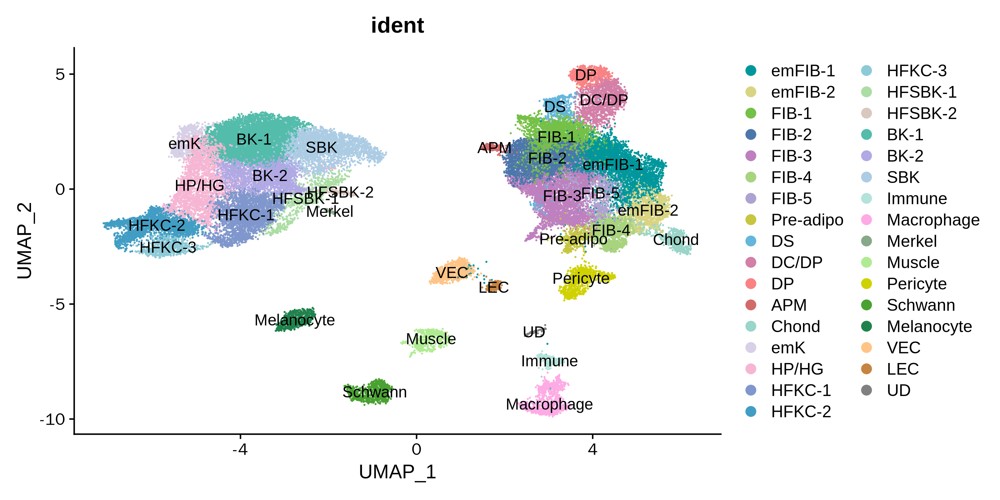

In [25]:
DimPlot(skin, label = TRUE, group.by = "ident", cols = cluster_colors)

In [26]:
meta_data <- data.frame(Cluster = Idents(skin), 
                        TimePoint = skin@meta.data$orig.ident)


In [27]:
library(dplyr)

In [28]:
cluster_composition <- meta_data %>%
  group_by(TimePoint, Cluster) %>%
  summarise(Count = n()) %>%
  group_by(TimePoint) %>%
  mutate(Proportion = Count / sum(Count))

`summarise()` has grouped output by 'TimePoint'. You can override using the
`.groups` argument.


In [29]:
library(patchwork)

In [77]:
options(repr.plot.width = 10, repr.plot.height = 5, repr.plot.res = 600)

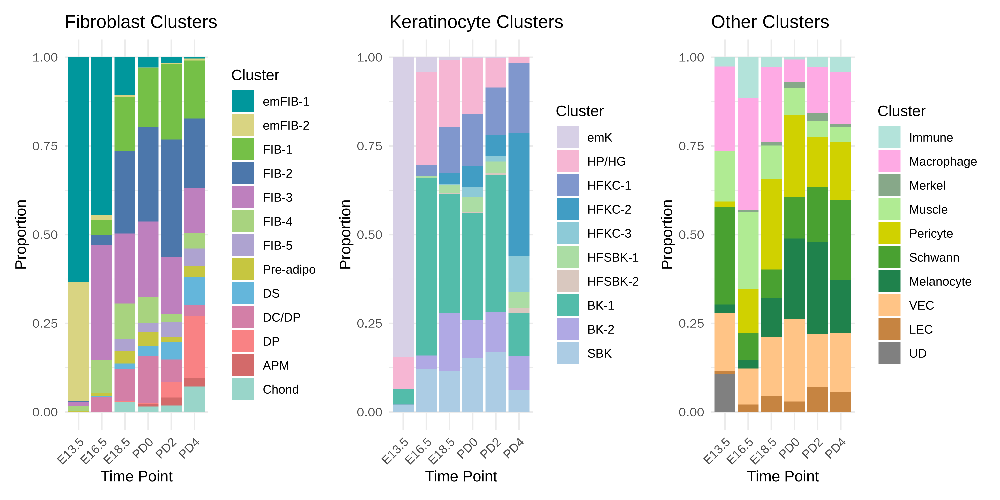

In [78]:
library(dplyr)

# Define subsets
fibroblast <- c("emFIB-1", "emFIB-2", "FIB-1", "FIB-2", "FIB-3", "FIB-4", "FIB-5", "Pre-adipo", "DS", "DC/DP", "DP", "APM", "Chond")
keratinocyte <-c("emK", "HP/HG", "HFKC-1", "HFKC-2", "HFKC-3", "HFSBK-1", "HFSBK-2", "BK-1", "BK-2", "SBK")
others <- c("Immune", "Macrophage", "Merkel", "Muscle", "Pericyte", "Schwann", "Melanocyte", "VEC", "LEC", "UD")

fibroblast_data <- cluster_composition %>%
  filter(Cluster %in% fibroblast)

fibroblast_plot <- ggplot(fibroblast_data, aes(x = TimePoint, y = Proportion, fill = Cluster)) +
  geom_bar(stat = "identity", position = "fill") +
  labs(x = "Time Point", y = "Proportion", title = "Fibroblast Clusters") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  scale_fill_manual(values = skin@misc$cluster_colors)

keratinocyte_data <- cluster_composition %>%
  filter(Cluster %in% keratinocyte)

keratinocyte_plot <- ggplot(keratinocyte_data, aes(x = TimePoint, y = Proportion, fill = Cluster)) +
  geom_bar(stat = "identity", position = "fill") +
  labs(x = "Time Point", y = "Proportion", title = "Keratinocyte Clusters") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  scale_fill_manual(values = skin@misc$cluster_colors)

others_data <- cluster_composition %>%
  filter(Cluster %in% others)

others_plot <- ggplot(others_data, aes(x = TimePoint, y = Proportion, fill = Cluster)) +
  geom_bar(stat = "identity", position = "fill") +
  labs(x = "Time Point", y = "Proportion", title = "Other Clusters") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  scale_fill_manual(values = skin@misc$cluster_colors)

combined_plot <- fibroblast_plot + keratinocyte_plot + others_plot

combined_plot

In [79]:
ggsave("./Fig2_rxiv/241018.compo_barplot.svg", width =10, height =5, units = 'in', dpi=600)

In [80]:
ggsave("./Fig2_rxiv/241018.compo_barplot_re.png", width =10, height =5, units = 'in', dpi=600)

In [86]:
options(repr.plot.width = 9, repr.plot.height = 4.5, repr.plot.res = 600)

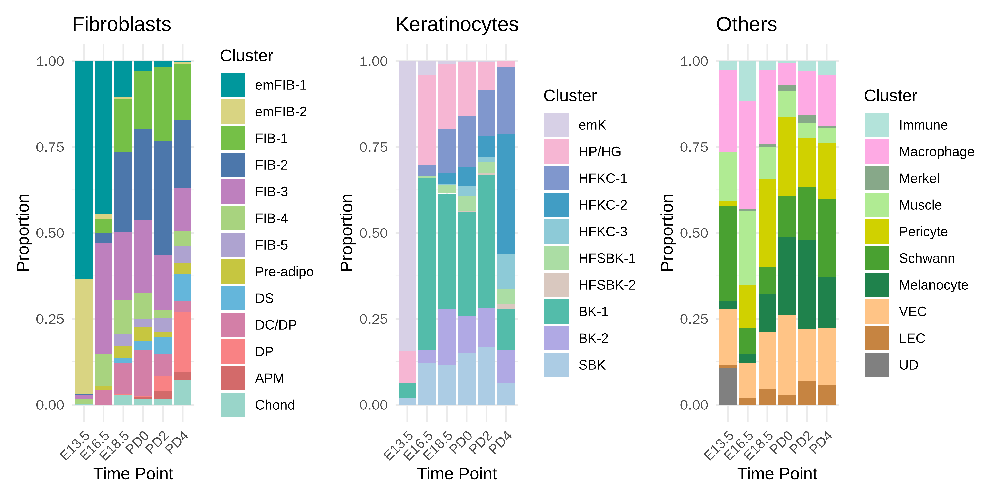

In [87]:
library(dplyr)

# Define subsets
fibroblast <- c("emFIB-1", "emFIB-2", "FIB-1", "FIB-2", "FIB-3", "FIB-4", "FIB-5", "Pre-adipo", "DS", "DC/DP", "DP", "APM", "Chond")
keratinocyte <-c("emK", "HP/HG", "HFKC-1", "HFKC-2", "HFKC-3", "HFSBK-1", "HFSBK-2", "BK-1", "BK-2", "SBK")
others <- c("Immune", "Macrophage", "Merkel", "Muscle", "Pericyte", "Schwann", "Melanocyte", "VEC", "LEC", "UD")

fibroblast_data <- cluster_composition %>%
  filter(Cluster %in% fibroblast)

fibroblast_plot <- ggplot(fibroblast_data, aes(x = TimePoint, y = Proportion, fill = Cluster)) +
  geom_bar(stat = "identity", position = "fill") +
  labs(x = "Time Point", y = "Proportion", title = "Fibroblasts") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  scale_fill_manual(values = skin@misc$cluster_colors)

keratinocyte_data <- cluster_composition %>%
  filter(Cluster %in% keratinocyte)

keratinocyte_plot <- ggplot(keratinocyte_data, aes(x = TimePoint, y = Proportion, fill = Cluster)) +
  geom_bar(stat = "identity", position = "fill") +
  labs(x = "Time Point", y = "Proportion", title = "Keratinocytes") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  scale_fill_manual(values = skin@misc$cluster_colors)

others_data <- cluster_composition %>%
  filter(Cluster %in% others)

others_plot <- ggplot(others_data, aes(x = TimePoint, y = Proportion, fill = Cluster)) +
  geom_bar(stat = "identity", position = "fill") +
  labs(x = "Time Point", y = "Proportion", title = "Others") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  scale_fill_manual(values = skin@misc$cluster_colors)

combined_plot <- fibroblast_plot + keratinocyte_plot + others_plot

combined_plot

In [88]:
ggsave("./Fig2_rxiv/241018.compo_barplot-2.svg", width =9, height =4.5, units = 'in', dpi=600)

In [33]:
metadata <- skin@meta.data

In [34]:
library(dplyr)

In [35]:
metadata <- metadata %>% mutate(detailed_label = paste(orig.ident, label, sep = "_"))

In [36]:
skin@meta.data$detailed_label <- metadata$detailed_label

In [38]:
Idents(object = skin) <- "detailed_label"

In [39]:
ident <-c("E13.5_emFIB-1", "E13.5_emFIB-2", "E16.5_emFIB-1", "E16.5_emFIB-2", "E16.5_DC/DP", "E18.5_FIB-1", "E18.5_FIB-2", "E18.5_FIB-3", "E18.5_FIB-4", "E18.5_DC/DP", "PD0_FIB-1","PD0_FIB-2", "PD0_FIB-3","PD0_FIB-4", "PD0_DC/DP", "PD2_APM", "PD2_FIB-1","PD2_FIB-2", "PD2_FIB-3","PD2_FIB-4", "PD2_DC/DP", "PD4_APM", "PD4_FIB-1", "PD4_FIB-2", "PD4_FIB-3", "PD4_FIB-4", "PD4_DP")

In [40]:
options(repr.plot.width = 6, repr.plot.height = 6, repr.plot.res = 1200)

In [41]:
p <- CoveragePlot(
  object = skin,
  region = "Dpp4", split.assays = TRUE, idents=ident, extend.upstream = 3000, ymax=20,
  extend.downstream = 3000)
p

In [42]:
ggsave("Coverageplot_DPP4.svg", width =6, height =6, units = 'in')

In [43]:
p <- CoveragePlot(
  object = skin,
  region = "Sox18", split.assays = TRUE, idents=ident, extend.upstream = 3000, 
    extend.downstream = 3000)
p

In [44]:
ggsave("Sox18.svg", width =6, height =6, units = 'in')

In [45]:
p <- CoveragePlot(
  object = skin,
  region = "Fabp4", split.assays = TRUE, idents=ident, extend.upstream = 3000, 
    extend.downstream = 3000)
p

In [46]:
ggsave("Fabp4.svg", width =6, height =6, units = 'in')

In [47]:
p <- CoveragePlot(
  object = skin,
  region = "Mfap5", split.assays = TRUE, idents=ident, extend.upstream = 3000, 
    extend.downstream = 3000)
p

In [48]:
ggsave("Mfap5.svg", width =6, height =6, units = 'in')

In [49]:
p <- CoveragePlot(
  object = skin,
  region = "Dlk1", split.assays = TRUE, idents=ident, extend.upstream = 3000, 
  extend.downstream = 3000)
p

In [50]:
ggsave("Dlk1.svg",  width =6, height =6, units = 'in')

In [51]:
ident <-c("E13.5_emK", "E16.5_HP/HG", "E18.5_HP/HG", "E18.5_HFKC-1", "E18.5_HFKC-2", "PD0_HFKC-1", "PD0_HFKC-2","PD0_HFKC-3", "PD2_HFKC-1", "PD2_HFKC-2", "PD2_HFKC-3", "PD4_HFKC-1", "PD4_HFKC-2", "PD4_HFKC-3")

In [52]:
p <- CoveragePlot(
  object = skin,
  region = "Sox9", split.assays = TRUE, idents=ident, extend.upstream = 3000, 
  extend.downstream = 3000)
p

Warning message:
“Removed 66 rows containing missing values or values outside the scale range
(`geom_segment()`).”


In [53]:
ggsave("Sox9.svg",  width =6, height =4, units = 'in')

Warning message:
“Removed 66 rows containing missing values or values outside the scale range
(`geom_segment()`).”


In [54]:
frags <- Fragments(skin)
length(frags)  #should be equal to the number of your fragment files

[1] 10

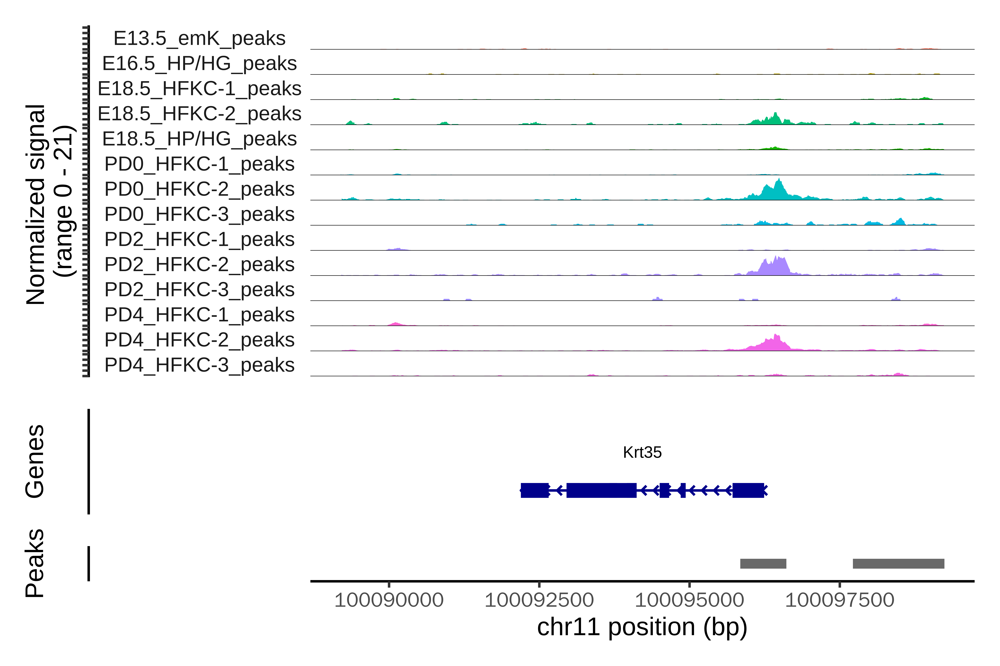

In [68]:
p <- CoveragePlot(
  object = skin,
  region = "Krt35", split.assays = TRUE, idents=ident, extend.upstream = 3000, 
  extend.downstream = 3000)
p

In [69]:
ggsave("Krt35.svg", width =6, height =4, units = 'in')

In [57]:
p <- CoveragePlot(
  object = skin,
  region = "Msx2", split.assays = TRUE, idents=ident, extend.upstream = 3000, 
  extend.downstream = 3000)
p

In [58]:
ggsave("Msx2.svg",  width =6, height =4, units = 'in')

In [59]:
p <- CoveragePlot(
  object = skin,
  region = "Barx2", split.assays = TRUE, idents=ident, extend.upstream = 3000, 
  extend.downstream = 3000)
p

In [60]:
ggsave("Barx2.svg", width =6, height =4, units = 'in')

In [61]:
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 1200)

Warning message:
“Removed 12 rows containing missing values or values outside the scale range
(`geom_segment()`).”


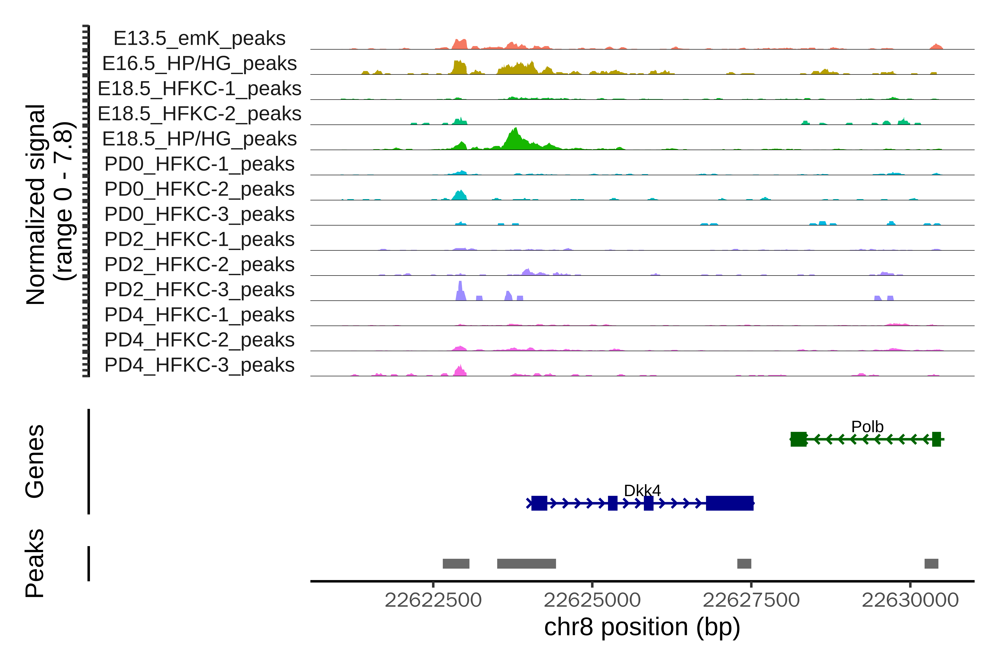

In [62]:
p <- CoveragePlot(
  object = skin,
  region = "Dkk4", split.assays = TRUE, idents=ident, extend.upstream = 3000, 
  extend.downstream = 3000)
p

In [63]:
ggsave("Dkk4.svg",  width =6, height =4, units = 'in')

Warning message:
“Removed 12 rows containing missing values or values outside the scale range
(`geom_segment()`).”


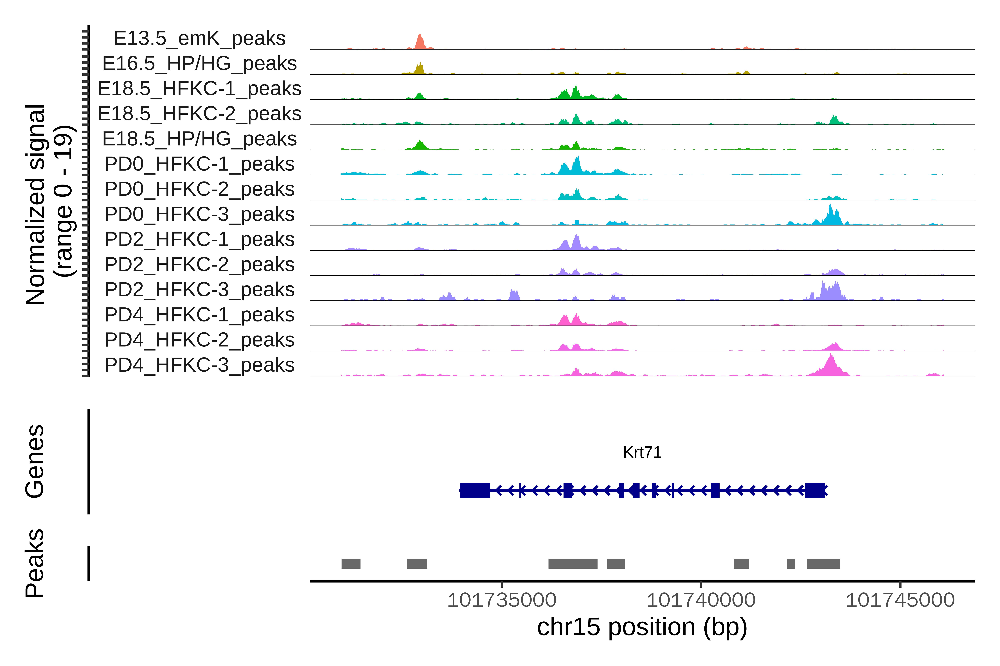

In [65]:
#cortex
p <- CoveragePlot(
  object = skin,
  region = "Krt71", split.assays = TRUE, idents=ident, extend.upstream = 3000, 
  extend.downstream = 3000)
p

In [66]:
ggsave("Krt71.svg", width =6, height =4, units = 'in')